In [25]:
import pipeline
import parsing
import path_settings as ps
import numpy as np
import matplotlib.pyplot as plt 

data = parsing.generate_input_target_arrays(ps.LINKFILE)
pixel_data, icontour, ocontour = data 
num_images = pixel_data.shape[0]

print("Number of available contours: "+ str(num_images))


Number of available contours: 46


In [384]:
# check correctness of data; i-contour should be fully inside o-contour
# commented plots out to reduce size of notebook
for i in range(num_images):
    ring = np.logical_xor(ocontour[i], icontour[i])    
    #fig = plt.figure()
    #ax= fig.add_subplot(111)
    #ax.imshow(ring, cmap=plt.cm.gray, aspect="equal", interpolation='nearest')

#plt.show()

In [362]:
# from rough visual overview I can see that some contours seem to be wrong:
# as i-contour should be fully within o-contour, after applying logical AND the number 
# of True values in i-contour and the overlap should be the same 

for i in range(num_images):
    overlap = np.logical_and(ocontour[i],icontour[i])
    num_True_overlap = sum(overlap.flatten())
    num_True_icontour = sum(icontour[i].flatten())
    
    if num_True_overlap != num_True_icontour:   
        print(num_True_icontour - num_True_overlap, "pixel overlap in image", i)
        


1 pixel overlap in image 4
3 pixel overlap in image 29
389 pixel overlap in image 37
447 pixel overlap in image 38
261 pixel overlap in image 39
501 pixel overlap in image 40
496 pixel overlap in image 41
214 pixel overlap in image 42
465 pixel overlap in image 43
337 pixel overlap in image 44
443 pixel overlap in image 45


Text(0.5,1,'Range of minimum graylevel intensities overall')

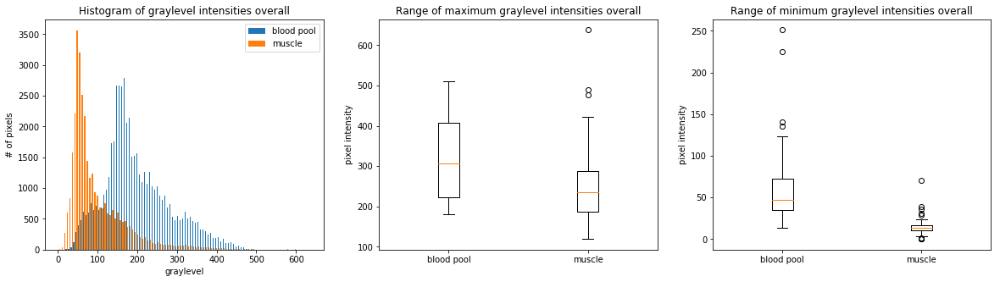

In [272]:
# each patient had ca. 9 o-contour files, the data arrays were generated patient after patient by appending to the end
# therefore I can be sure that the last 9 problematic images all come from the same patient.
# from this and the previous plots I can see overlap is quite large and does not make sense biologically
# -> give Patient "SCD0000501" back into manual labeling process
# rest is okay, even though not perfect, because two more images have an overlap and just because there is no overlap does 
# mean that the size of contoured the muscle is the actual size


blood_intensities_overall = []
ring_intensities_overall = []

highest_ring = []
highest_blood = []

lowest_ring = []
lowest_blood = []


for i in range(40):
    ring = np.logical_xor(ocontour[i], icontour[i]).flatten()
    blood_pool = icontour[i].flatten()
    p = pixel_data[i].flatten()
    
    ring_intensities = p[ring]   
    blood_pool_intensities = p[blood_pool]
    
    highest_ring.append(np.max(ring_intensities))
    highest_blood.append(np.max(blood_pool_intensities))
    
    lowest_ring.append(np.min(ring_intensities))
    lowest_blood.append(np.min(blood_pool_intensities))
    
    blood_intensities_overall.extend(blood_pool_intensities)
    ring_intensities_overall.extend(ring_intensities)


fig = plt.figure(figsize=(20, 5))
plt.subplot(131)
data_to_plot = [blood_intensities_overall,ring_intensities_overall ]
n_bins = 100
plt.hist(data_to_plot, n_bins, histtype='bar', label=['blood pool', 'muscle'])
plt.legend(prop={'size': 10})
plt.legend(loc = 1)
plt.ylabel('# of pixels')
plt.xlabel('graylevel')
plt.title('Histogram of graylevel intensities overall')

plt.subplot(132)
data_to_plot = [highest_blood, highest_ring] 
plt.boxplot(data_to_plot)
plt.xticks([1, 2], ['blood pool', 'muscle']) 
plt.ylabel('pixel intensity')
plt.title('Range of maximum graylevel intensities overall')

plt.subplot(133)
data_to_plot = [lowest_blood, lowest_ring]
plt.boxplot(data_to_plot)
plt.xticks([1, 2], ['blood pool', 'muscle'])
plt.ylabel('pixel intensity')
plt.title('Range of minimum graylevel intensities overall')


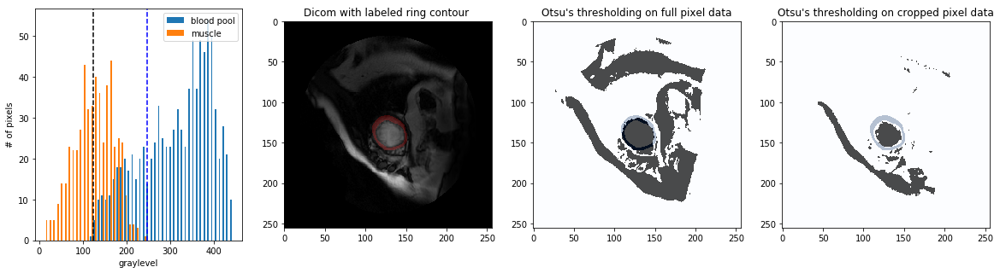

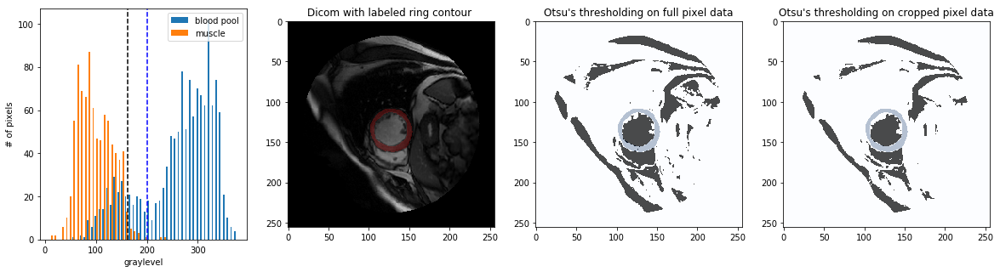

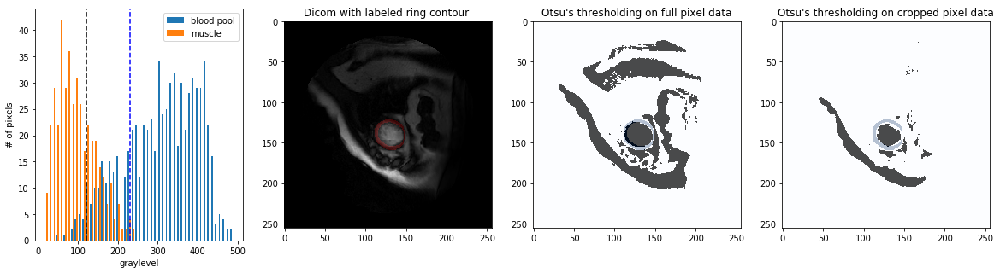

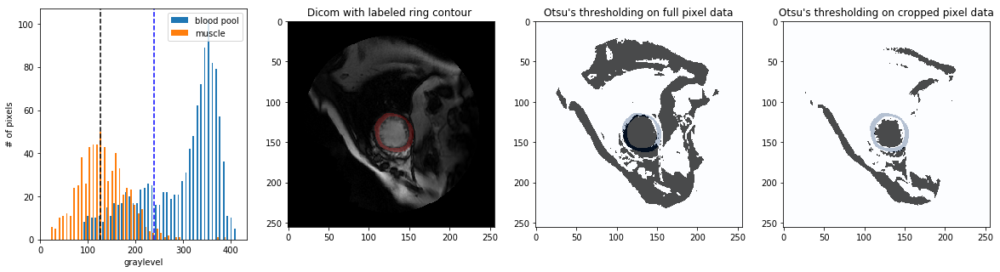

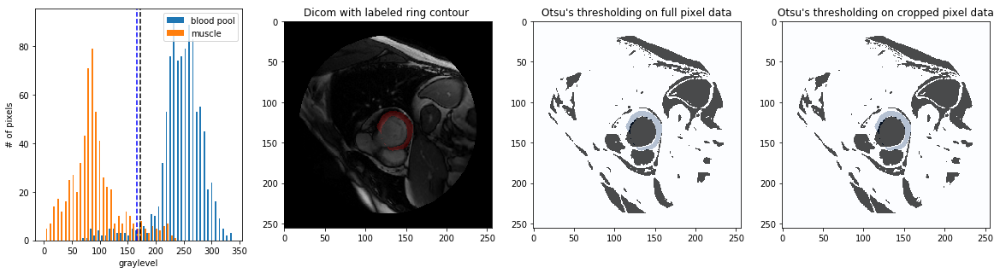

...

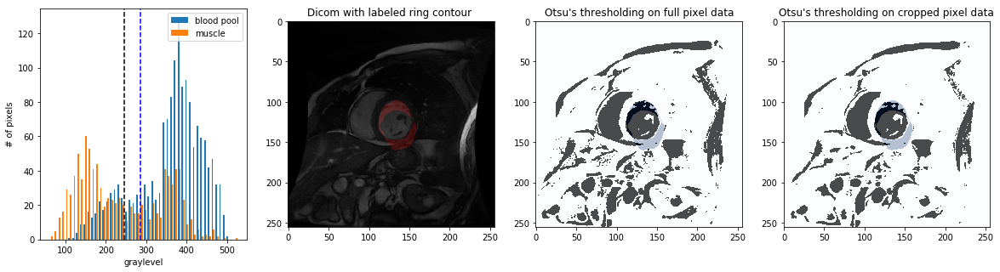

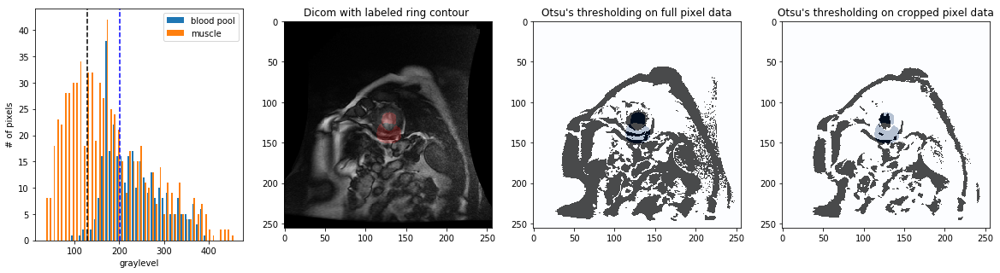

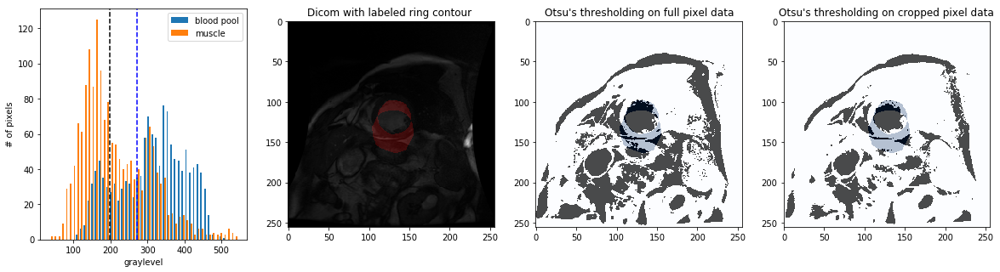

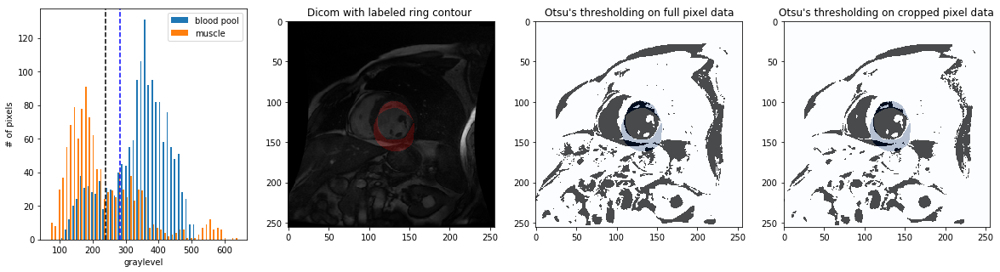

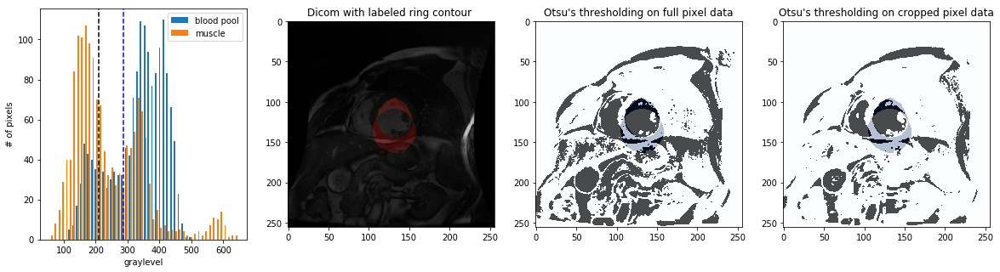

In [305]:

from skimage import data
from skimage import filters


for i in range(num_images):

    # gather pixel intensities of blood pool and muscle 
    ring = np.logical_xor(ocontour[i], icontour[i]).flatten()
    blood_pool = icontour[i].flatten()
    pixel = pixel_data[i].flatten()
    
    ring_intensities = pixel[ring]   
    blood_pool_intensities = pixel[blood_pool]

    
    to_crop = ocontour[i].flatten()
    cropped_pixel_data = pixel[to_crop]


    # apply scikits implementation of finding a threshold with otsu's method 
    thresh_full = filters.threshold_otsu(pixel)
    thresh_cropped = filters.threshold_otsu(cropped_pixel_data)

    
    # plot results 
    fig = plt.figure(figsize=(20, 5))

    plt.subplot(141)
    data_to_plot = [blood_pool_intensities,ring_intensities ]
    n_bins = 50
    plt.hist(data_to_plot, n_bins, histtype='bar', label=['blood pool', 'muscle'])
    plt.legend(prop={'size': 10},loc =1)
    plt.axvline(thresh_full, color='k', ls='--', label='full image')
    plt.axvline(thresh_cropped, color='b', ls='--', label='cropped image')
    plt.ylabel('# of pixels')
    plt.xlabel('graylevel')

    plt.subplot(142)
    plt.imshow(pixel_data[i], cmap='gray', interpolation='nearest')
    
    r = np.logical_xor(ocontour[i], icontour[i])
    plt.imshow(r, cmap='flag_r', interpolation='nearest', alpha=0.2)
    plt.title("Dicom with labeled ring contour ")
    
    plt.subplot(143)
    plt.imshow(pixel_data[i] < thresh_full, cmap='gray', interpolation='nearest')
    plt.imshow(r, cmap='Blues', interpolation='nearest', alpha=0.3)
    plt.title("Otsu's thresholding on full pixel data")
    
    plt.subplot(144)
    plt.imshow(pixel_data[i] < thresh_cropped, cmap='gray', interpolation='nearest')
    plt.imshow(r, cmap='Blues', interpolation='nearest', alpha=0.3)
    plt.title("Otsu's thresholding on cropped pixel data")
    
    plt.show()

/home/ulie/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


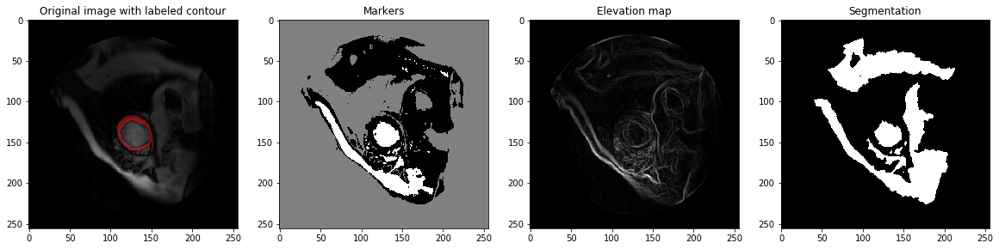

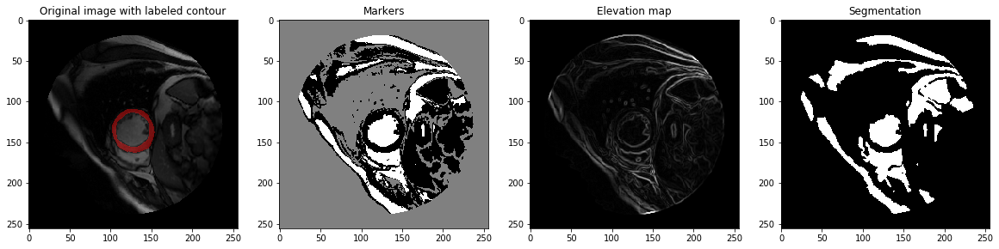

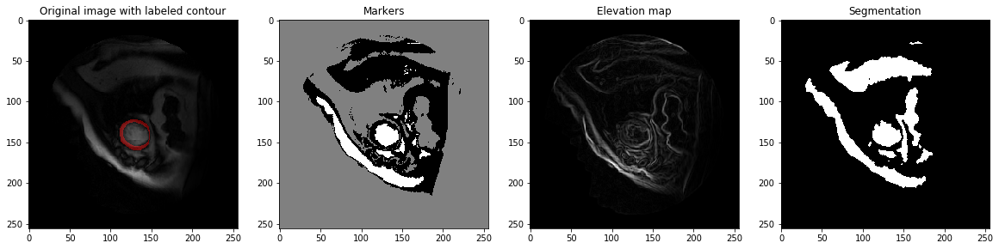

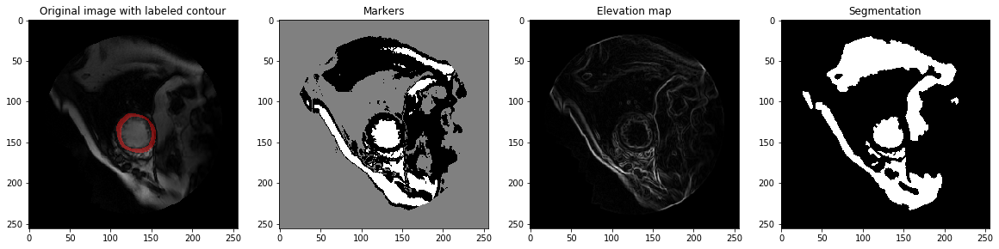

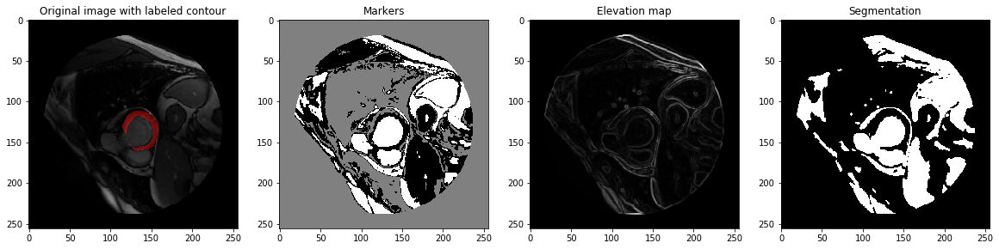

...

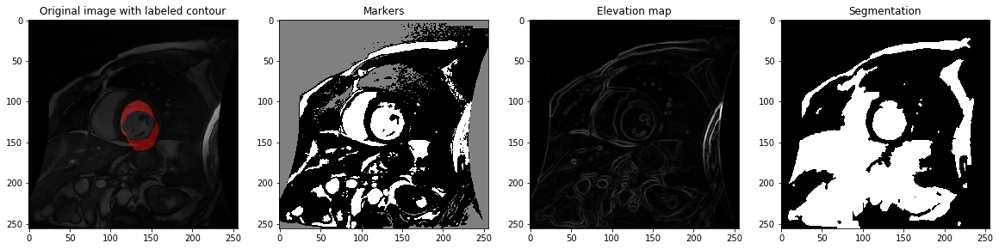

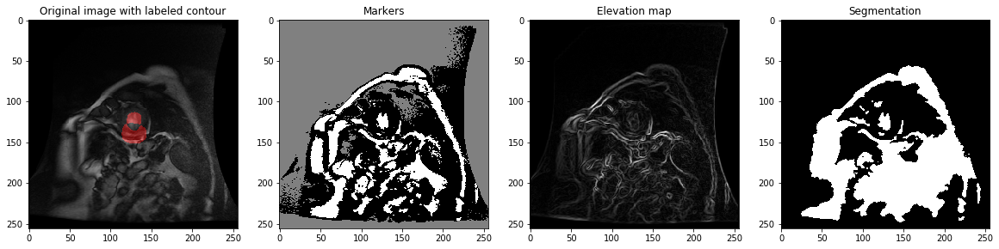

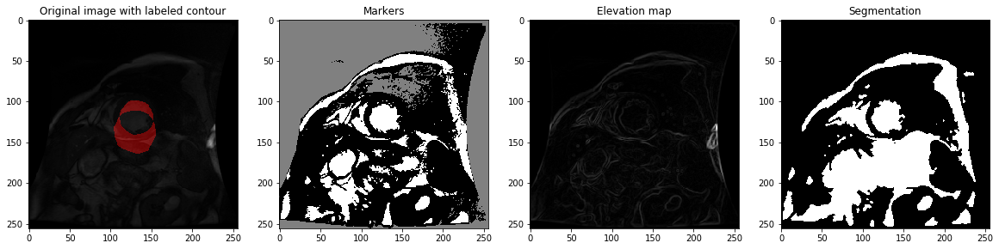

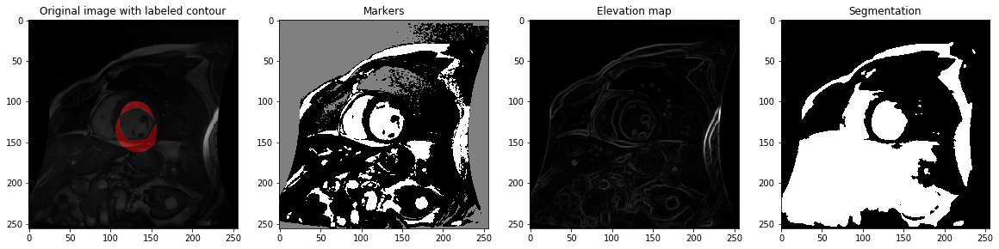

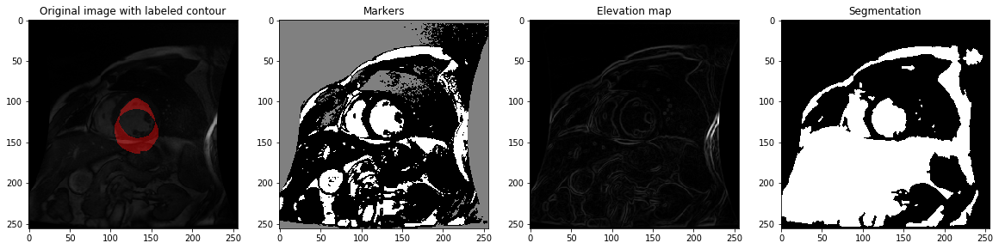

In [379]:
from skimage.morphology import watershed
from skimage.filters import sobel


for i in range(num_images):    
    
    # edge detection based on sobel operator
    elevation_map = sobel(pixel_data[i])

    
    # markers should be picked to be extreme values representing both 'groups' 
    markers = np.zeros_like(pixel_data[i])
    markers[pixel_data[i] < 50] = 1
    markers[pixel_data[i] > 180] = 2
    
    # apply watershed transform 
    segmentation = morphology.watershed(elevation_map, markers)

    fig = plt.figure(figsize=(20, 5))
    plt.subplot(141)
    plt.imshow(pixel_data[i], cmap='gray')
    r = np.logical_xor(ocontour[i], icontour[i])
    plt.imshow(r, cmap='flag_r', interpolation='nearest', alpha=0.4)
    plt.title('Original image with labeled contour')
    
    plt.subplot(142)
    plt.imshow(markers, cmap= 'gray')
    plt.title('Markers')
    
    plt.subplot(143)
    plt.imshow(elevation_map, cmap='gray')
    plt.title('Elevation map')
    
    plt.subplot(144)
    plt.imshow(segmentation, cmap= 'gray')
    plt.title('Segmentation')


/home/ulie/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


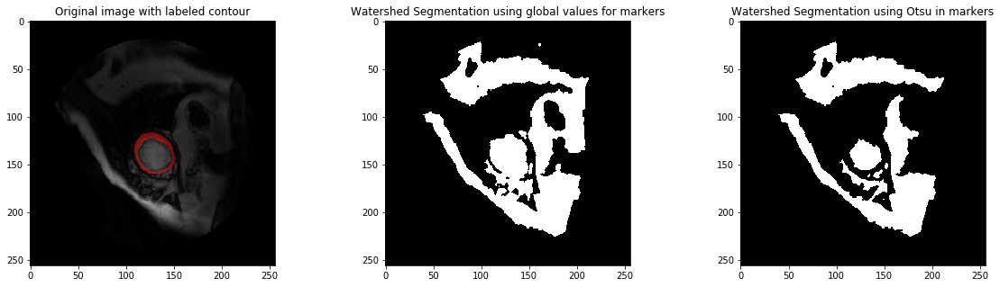

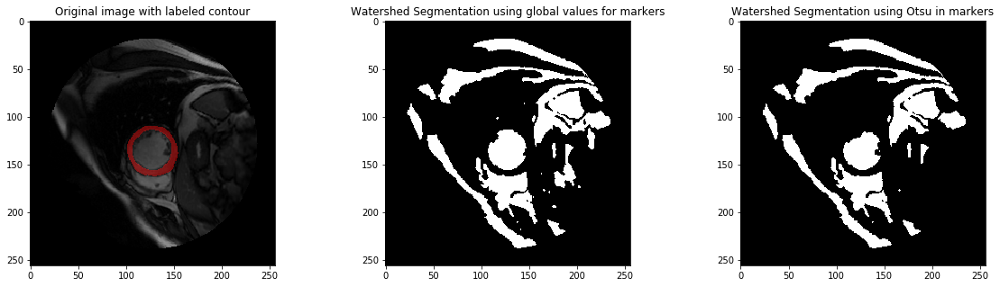

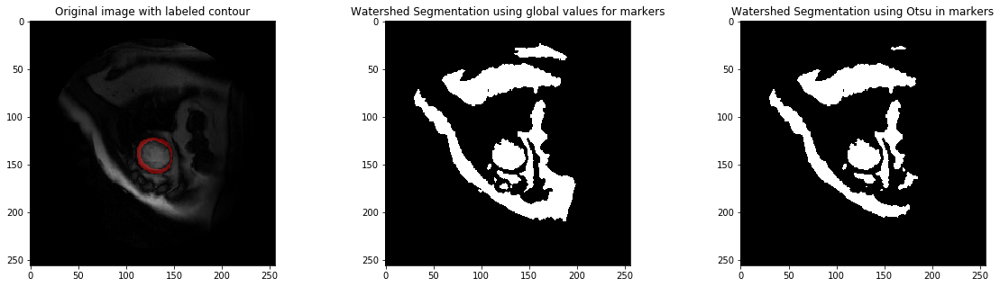

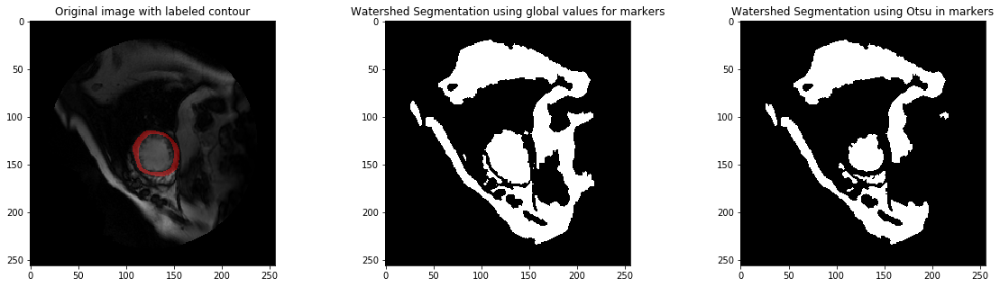

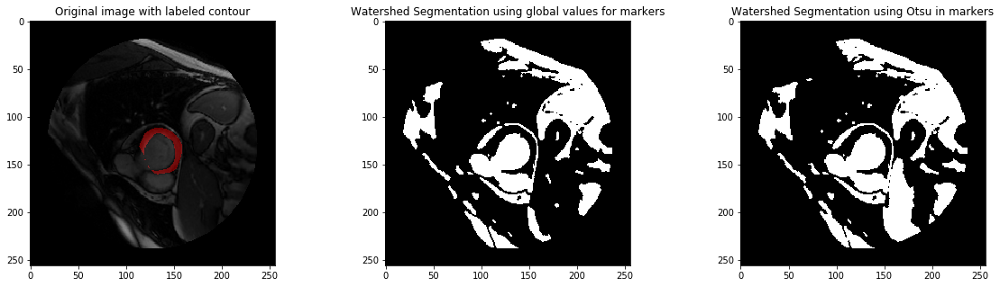

...

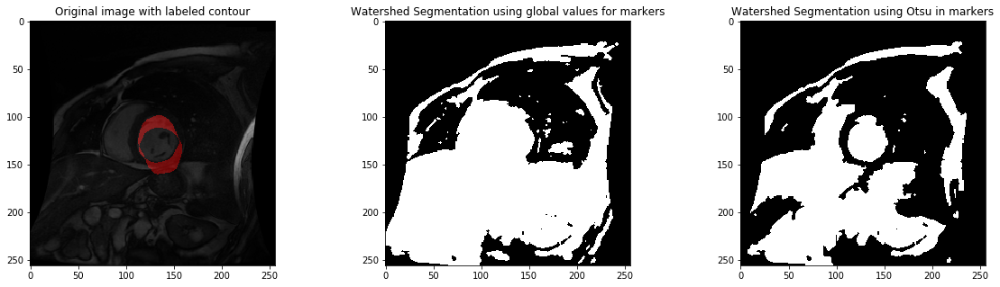

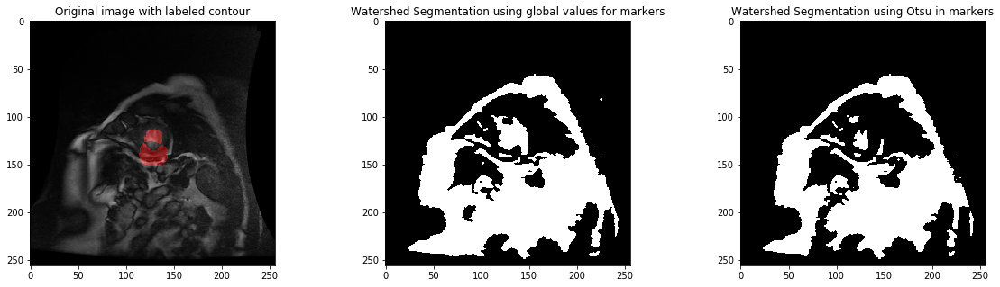

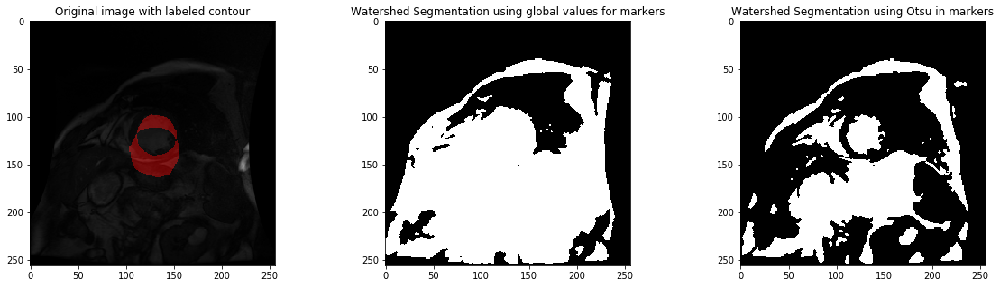

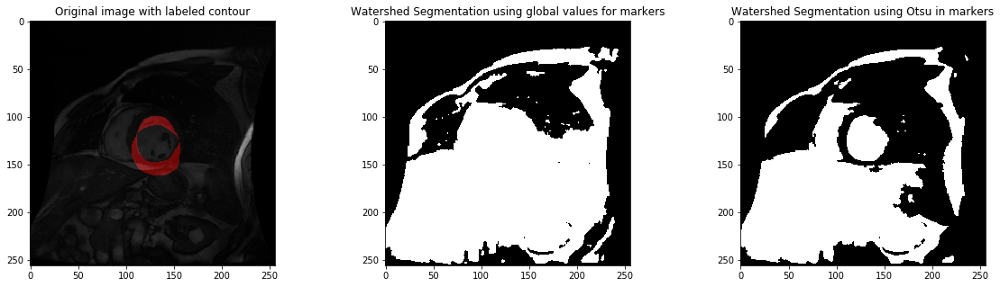

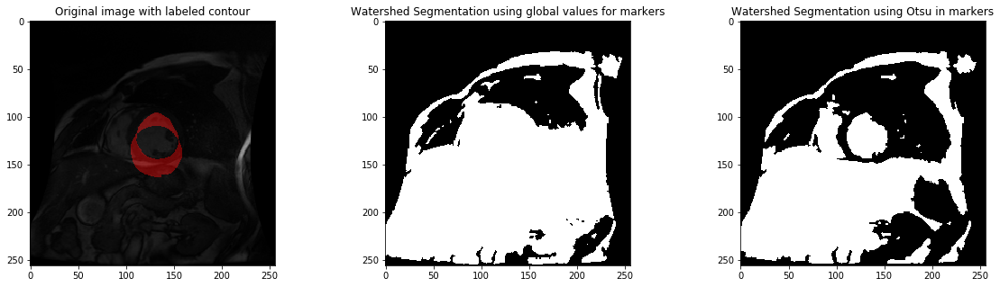

In [382]:
# compare both methods for initializing markers

for i in range(num_images):    
    
    # edge detection based on sobel operator
    elevation_map = sobel(pixel_data[i])

    pixel = pixel_data[i].flatten()  
    to_crop = ocontour[i].flatten()
    cropped_pixel_data = pixel[to_crop]

    # otsu's method for finding a threshold to initialize markers
    thresh_cropped = filters.threshold_otsu(cropped_pixel_data)
    
    # markers using global values
    markers_global = np.zeros_like(pixel_data[i])
    markers_global[pixel_data[i] < 50] = 1
    markers_global[pixel_data[i] > 180] = 2
    
    # markers using otsu's threshold for the i-contour
    markers_otsu = np.zeros_like(pixel_data[i])
    markers_otsu[pixel_data[i] < 50] = 1
    markers_otsu[pixel_data[i] > thresh_cropped] = 2
    
    
    # apply watershed transform 
    segmentation_global = morphology.watershed(elevation_map, markers_global)
    segmentation_otsu = morphology.watershed(elevation_map, markers_otsu)
    
    
    fig = plt.figure(figsize=(20, 5))
    plt.subplot(131)
    plt.imshow(pixel_data[i], cmap='gray')
    r = np.logical_xor(ocontour[i], icontour[i])
    plt.imshow(r, cmap='flag_r', interpolation='nearest', alpha=0.4)
    plt.title('Original image with labeled contour')
    
    
    plt.subplot(132)
    plt.imshow(segmentation_global, cmap='gray')
    plt.title('Watershed Segmentation using global values for markers')
    
    plt.subplot(133)
    plt.imshow(segmentation_otsu, cmap= 'gray')
    plt.title('Watershed Segmentation using Otsu in markers')
    